In [14]:
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
import os
import git
from pathlib import Path
import imageio
CWD = os.getcwd()
ROOT_DIR = Path(git.Repo('.', search_parent_directories=True).working_tree_dir)
SAVE_FIGS = True
plots_path = os.path.join(ROOT_DIR, "publication", "paper", "draft_plots")

In [15]:
os.chdir(os.path.join(ROOT_DIR, "utilities"))
from transform import *
os.chdir(CWD)
np.random.seed(0)

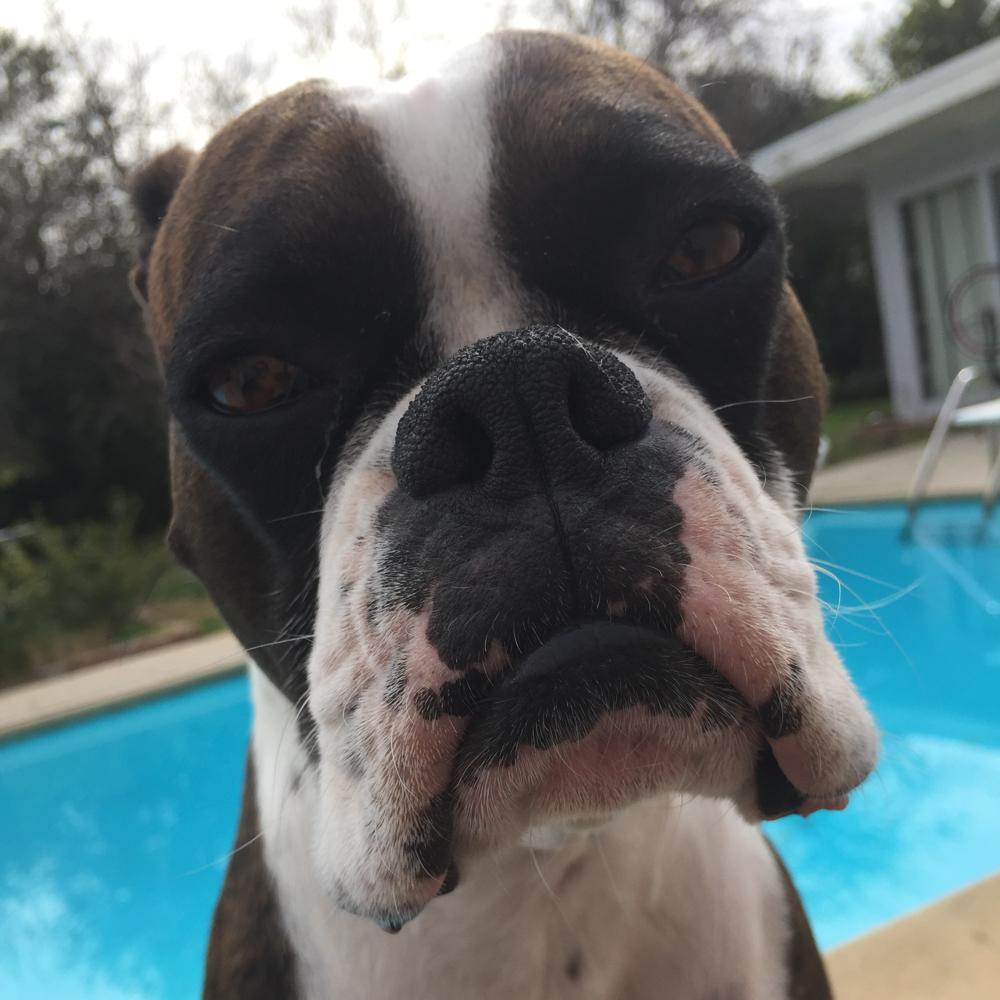

In [16]:
img = Image.open('scout_old.png')  # Replace with your image path
img

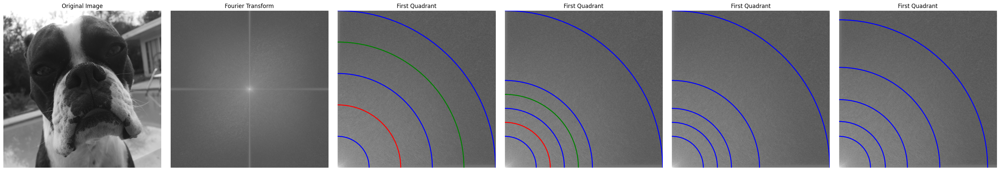

In [17]:
from matplotlib.patches import Circle

fig, axs = plt.subplots(1, 6, figsize=(30, 5))


# Convert the image to grayscale if not already done
img_gray = img.convert('L')

# Compute the 2D Fourier Transform of the grayscale image
f = np.fft.fft2(np.array(img_gray))
fshift = np.fft.fftshift(f)
magnitude_spectrum = 20 * np.log(np.abs(fshift) + 1)

# Extract the first quadrant of the magnitude spectrum
rows, cols = magnitude_spectrum.shape
# Extract the first quadrant with the origin at the bottom left
first_quadrant = np.fliplr(magnitude_spectrum[rows // 2:, :cols // 2])




# Original image
axs[0].imshow(img_gray, cmap='gray')
axs[0].set_title('Original Image')
axs[0].axis('off')

# Fourier Transform (magnitude spectrum)
axs[1].imshow(magnitude_spectrum, cmap='gray')
axs[1].set_title('Fourier Transform')
axs[1].invert_yaxis()
axs[1].axis('off')

# First quadrant of the spectrum with circles
axs[2].imshow(first_quadrant, cmap='gray')
axs[2].set_title('First Quadrant')
axs[2].invert_yaxis()
axs[2].axis('off')

# Add four circles with equally spaced radii centered at the origin (top-left corner)

height, width = first_quadrant.shape
center = (0, 0)  # origin at top-left

max_radius = min(width, height)
radii = np.linspace(max_radius // 5, max_radius, 5)



for i in range(len(radii)):
    if i == 1:
        color = "red" 
    elif i == 3:
        color = "green"
    else:
        color = "blue"
        
    
    r = radii[i]
    circ = Circle(center, r, fill=False, color=color, linewidth=2)
    axs[2].add_patch(circ)


axs[3].imshow(first_quadrant, cmap='gray')
axs[3].set_title('First Quadrant')
axs[3].invert_yaxis()
axs[3].axis('off')

# Add four circles with equally spaced radii centered at the origin (top-left corner)

height, width = first_quadrant.shape
center = (0, 0)  # origin at top-left

max_radius = min(width, height)
radii = np.linspace(max_radius // 5, max_radius, 10)



for i in range(len(radii)):
    if i ==  1:
        color = "red"
    elif i in [3]:
        color = "green"
    elif i in [0, 2, 4, 9]:
        color = "blue"
    else:
       continue
        
    
    r = radii[i]
    circ = Circle(center, r, fill=False, color=color, linewidth=2)
    axs[3].add_patch(circ)

axs[4].imshow(first_quadrant, cmap='gray')
axs[4].set_title('First Quadrant')
axs[4].invert_yaxis()
axs[4].axis('off')

# Add four circles with equally spaced radii centered at the origin (top-left corner)

height, width = first_quadrant.shape
center = (0, 0)  # origin at top-left

max_radius = min(width, height)
radii = np.linspace(max_radius // 5, max_radius, 10)



for i in range(len(radii)):
    if i in [0, 1, 2, 4, 9]:
        color = "blue"
    else:
       continue
        
    
    r = radii[i]
    circ = Circle(center, r, fill=False, color=color, linewidth=2)
    axs[4].add_patch(circ)

axs[5].imshow(first_quadrant, cmap='gray')
axs[5].set_title('First Quadrant')
axs[5].invert_yaxis()
axs[5].axis('off')

# Add four circles with equally spaced radii centered at the origin (top-left corner)

height, width = first_quadrant.shape
center = (0, 0)  # origin at top-left

max_radius = min(width, height)
radii = getSplits(max_radius // 5 , max_radius, 1.474134181757687)[:-1]



for i in range(len(radii)):
    color = "blue"
    r = radii[i]
    circ = Circle(center, r, fill=False, color=color, linewidth=2)
    axs[5].add_patch(circ)

plt.tight_layout()
plt.show()


In [18]:
radii = np.linspace(max_radius // 5, max_radius, 10)
radii_good = radii[[0, 1, 2, 4, 9]]
radii_good

array([ 244.        ,  352.88888889,  461.77777778,  679.55555556,
       1224.        ])

In [19]:
logy = np.log(radii_good)
np.exp(np.polyfit(np.arange(len(radii_good)), logy, 1)[0])


np.float64(1.474134181757687)

In [20]:
splits = getSplits(max_radius // 5 , max_radius, 1.474134181757687)

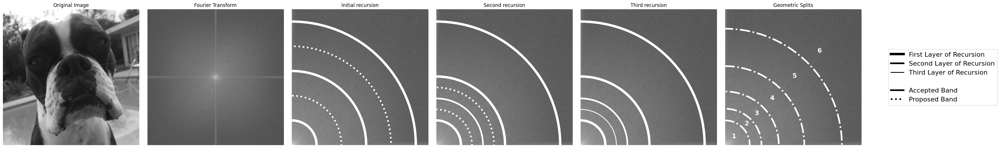

In [23]:
from matplotlib.patches import Circle
from matplotlib.lines import Line2D

fig, axs = plt.subplots(1, 6, figsize=(30, 5))


# Convert the image to grayscale if not already done
img_gray = img.convert('L')

# Compute the 2D Fourier Transform of the grayscale image
f = np.fft.fft2(np.array(img_gray))
fshift = np.fft.fftshift(f)
magnitude_spectrum = 20 * np.log(np.abs(fshift) + 1)

# Extract the first quadrant of the magnitude spectrum
rows, cols = magnitude_spectrum.shape
# Extract the first quadrant with the origin at the bottom left
first_quadrant = np.fliplr(magnitude_spectrum[rows // 2:, :cols // 2])




# Original image
axs[0].imshow(img_gray, cmap='gray')
axs[0].set_title('Original Image')
axs[0].axis('off')

# Fourier Transform (magnitude spectrum)
axs[1].imshow(magnitude_spectrum, cmap='gray')
axs[1].set_title('Fourier Transform')
axs[1].invert_yaxis()
axs[1].axis('off')

# First quadrant of the spectrum with circles
axs[2].imshow(first_quadrant, cmap='gray')
axs[2].set_title('Initial recursion')
axs[2].invert_yaxis()
axs[2].axis('off')

# Add four circles with equally spaced radii centered at the origin (top-left corner)

height, width = first_quadrant.shape
center = (0, 0)  # origin at top-left

max_radius = min(width, height)/1.1
radii = np.linspace(max_radius // 5, max_radius, 5)

large_width = 6
mid_width = 4
small_width = 2
color = "white"
for i in range(len(radii)):
    if i == 1:
        #color = "red"
        color = color
        linewidth = mid_width
        linestyle = "dotted" 
    elif i == 3:
        #color = "green"
        color = color
        linewidth = mid_width
        linestyle = "dotted" 
    else:
        #color = "blue"
        color = color
        linewidth = large_width
        linestyle = "solid"


    r = radii[i]
    circ = Circle(center, r, fill=False, color=color, linewidth= linewidth, linestyle=linestyle)
    axs[2].add_patch(circ)


axs[3].imshow(first_quadrant, cmap='gray')
axs[3].set_title('Second recursion')
axs[3].invert_yaxis()
axs[3].axis('off')

# Add four circles with equally spaced radii centered at the origin (top-left corner)

height, width = first_quadrant.shape
center = (0, 0)  # origin at top-left


radii = np.linspace(max_radius // 5, max_radius, 10)



for i in range(len(radii)):
    if i ==  1:
        #color = "red"
        color = color
        linewidth = mid_width
        linestyle = "dotted"
    elif i in [3]:
        #color = "green"
        color = color
        linewidth = mid_width
        linestyle = "dotted"
    elif i in [0, 2, 4, 9]:
        #color = "blue"
        color = color
        linestyle = "solid"
        if i in[0, 4, 9]:
            linewidth = large_width
        else:
            linewidth = mid_width
    else:
       continue
        
    
    r = radii[i]
    circ = Circle(center, r, fill=False, color=color, linewidth=linewidth, linestyle=linestyle)
    axs[3].add_patch(circ)

axs[4].imshow(first_quadrant, cmap='gray')
axs[4].set_title('Third recursion')
axs[4].invert_yaxis()
axs[4].axis('off')

# Add four circles with equally spaced radii centered at the origin (top-left corner)

height, width = first_quadrant.shape
center = (0, 0)  # origin at top-left


radii = np.linspace(max_radius // 5, max_radius, 10)



for i in range(len(radii)):
    if i in [0, 1, 2, 4, 9]:
        #color = "blue"
        color = color
        linestyle = "solid"
        if i in [0, 4, 9]:
            linewidth = large_width
        elif i == 2:
            linewidth = mid_width
        else:
            linewidth = small_width
    else:
       continue
        
    
    r = radii[i]
    circ = Circle(center, r, fill=False, color=color, linewidth=linewidth, linestyle=linestyle)
    axs[4].add_patch(circ)

axs[5].imshow(first_quadrant, cmap='gray')
axs[5].set_title('Geometric Splits')
axs[5].invert_yaxis()
axs[5].axis('off')

# Add four circles with equally spaced radii centered at the origin (top-left corner)

height, width = first_quadrant.shape
center = (0, 0)  # origin at top-left


radii = getSplits(max_radius // 5 , max_radius, 1.474134181757687)[:-1]



for i in range(len(radii)):
    #color = "blue"
    color = color
    r = radii[i]
    circ = Circle(center, r, fill=False, color=color, linewidth=4, linestyle="dashdot")
    axs[5].add_patch(circ)
    # Add band numbers between the bands
    

    # Add band 1 label at the middle of the first band
    angle = np.pi / 4  # 45 degrees
    if i == 0:
        band_label = "1"
        r_text = radii[0] / 2
        x = r_text * np.cos(angle)
        y = r_text * np.sin(angle)
        axs[5].text(x, y, band_label, color='white', fontsize=16, fontweight='bold', va='center', ha='center')
    # Add band 2-5 labels
    if i > 0:
        band_label = str(i+1)  # Always use the current band index as the label
        r_text = (radii[i-1] + r) / 2
        x = r_text * np.cos(angle)
        y = r_text * np.sin(angle)
        axs[5].text(x, y, band_label, color='white', fontsize=16, fontweight='bold', va='center', ha='center')
    # Add band 6 label at the middle of the last band (between last radius and max_radius)
    if i == len(radii) - 1:
        band_label = "6"
        r_text = (radii[-1] + max_radius) / 1.8
        x = r_text * np.cos(angle)
        y = r_text * np.sin(angle)
        axs[5].text(x, y, band_label, color='white', fontsize=16, fontweight='bold', va='center', ha='center')

plt.tight_layout()

legend_elements = [
    #recursion elements
    Line2D([0], [0], color='black', lw=large_width, linestyle='solid', label='First Layer of Recursion'),
    Line2D([0], [0], color='black', lw=mid_width, linestyle='solid', label='Second Layer of Recursion'),
    Line2D([0], [0], color='black', lw=small_width, linestyle='solid', label='Third Layer of Recursion'),
    # Separator (empty handle)
    Line2D([], [], color='none', label=''),
    #band elements
    Line2D([0], [0], color='black', lw=mid_width, linestyle='solid', label='Accepted Band'),
    Line2D([0], [0], color='black', lw=mid_width, linestyle='dotted', label='Proposed Band'),
]

fig.legend(handles=legend_elements, loc='center left', bbox_to_anchor=(1.02, 0.5), fontsize=16)
plt.show()
if SAVE_FIGS:
    fig.savefig(os.path.join(plots_path, "fourierGraphic.png"), bbox_inches='tight')
    f

In [22]:
2**16

65536